[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 2243 from -360.0 to -60.0 deg.
[warn | PowerModels]: this code only supports angmax values in -90 deg. to 90 deg., tightening the value on branch 2243 from 360.0 to 60.0 deg.
[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 1881 from -360.0 to -60.0 deg.
[warn | PowerModels]: this code only supports angmax values in -90 deg. to 90 deg., tightening the value on branch 1881 from 360.0 to 60.0 deg.
[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 1907 from -360.0 to -60.0 deg.
[warn | PowerModels]: this code only supports angmax values in -90 deg. to 90 deg., tightening the value on branch 1907 from 360.0 to 60.0 deg.
[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 599 from -360.0

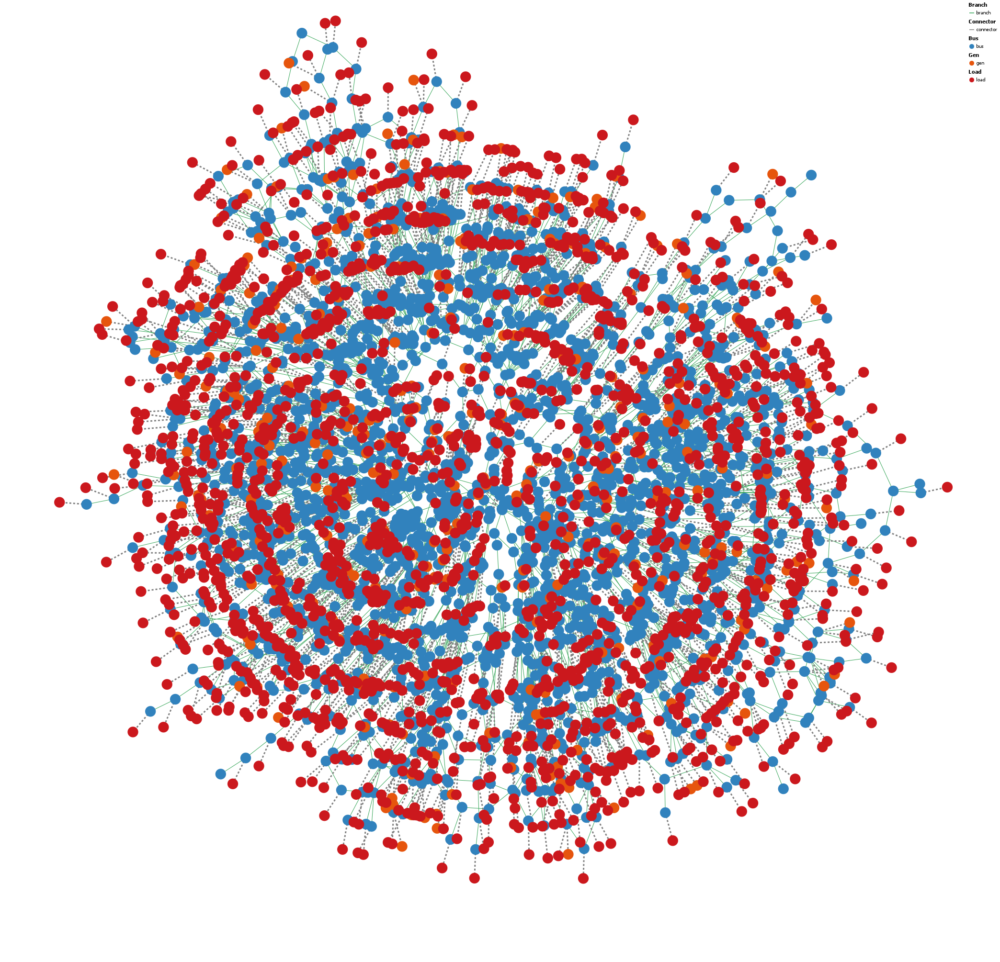

In [4]:
using PowerPlots
using PowerModels

# Parse the MATPOWER case
sys = PowerModels.parse_file("case2383wp.m")
# sys = PowerModels.parse_file("case14.m")

plot = powerplot(sys;
    width = 2000, height = 2000,
    fixed = false,                         # allow layout algorithm to place nodes
    node = (:size => 3),                   # << much smaller than default 500
    branch = (:size => 1),                 # thin branches
)

display(plot)



Found 3 connected components:
Component 1 buses: ["1", "12", "13", "14", "2", "3", "4", "5", "6", "7", "8", "9"]
Component 2 buses: ["10"]
Component 3 buses: ["11"]


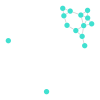

In [23]:
using Graphs
using GraphPlot

# Use same MATPOWER or JSON case

# Build undirected graph from buses and branches
bus_ids = sort(collect(keys(sys["bus"])))
bus_index = Dict(bus_id => i for (i, bus_id) in enumerate(bus_ids))

# Create sparse graph of our grid
g = SimpleGraph(length(bus_ids))

# Add branches to the graph
for branch in values(sys["branch"])
        f = branch["f_bus"]
        t = branch["t_bus"]

        #Island Invoker (prevents branches from connecting to certain buses)
        if f in [10, 11] || t in [10, 11]
            continue
        end
        # Add branch as an edge to our sparse graph
        add_edge!(g, bus_index[string(f)], bus_index[string(t)])
end

# Get connected components
components = connected_components(g)

println("Found $(length(components)) connected components:")
for (i, comp) in enumerate(components)
    println("Component $i buses: ", [bus_ids[j] for j in comp])
end

gplot(g, layout=spring_layout)